## Problem description

- The Kaggle "GANs: Getting Started" competition tasks participants with building a Generative Adversarial Network (GAN) to generate synthetic images that resemble real ones. GANs are a class of deep learning models consisting of two neural networks—a generator and a discriminator—that compete in a minimax game: the generator tries to create realistic data, while the discriminator attempts to distinguish between real and generated samples.

- **CycleGAN** is used in this solution and it's a specialized generative adversarial network (GAN) architecture designed for unpaired image-to-image translation, making it ideal for converting photos to Monet-style paintings without requiring matched photo-painting pairs. Here's how it works:

### Core Architecture
CycleGAN uses two generators and two discriminators in a cyclic structure:

- **Generator G**: Translates photos → Monet style (G_PM)
- **Generator F**: Translates Monet style → photos (F_MP)
- **Discriminator D_M**: Distinguishes real Monet paintings vs. generated Monet
- **Discriminator D_P**: Distinguishes real photos vs. generated photos

### Key Mechanisms

#### Adversarial Loss

- Each generator tries to "fool" its discriminator:
- G_PM aims to make D_M classify generated Monet as real
- F_MP aims to make D_P classify generated photos as real

#### Cycle Consistency Loss
- Critical for unpaired training:
    - Photo → Monet → Photo should reconstruct original photo
    - Monet → Photo → Monet should reconstruct original Monet
- Ensures content preservation while changing style
- Identity Loss
    - Stabilizes training by encouraging generators to preserve colors/textures when fed images from their target domain

### Monet-Specific Implementation
- Training Data:
    - Unpaired sets: ~300 Monet paintings + thousands of photos
- Preprocessing:
    - Random cropping (286×286 → 256×256)
    - Horizontal flipping
    - Normalization to [-1, 1]


In [1]:
import os
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, utils
import matplotlib.pyplot as plt
from torch.nn.utils import spectral_norm
from torchsummary import summary
from torchvision.utils import save_image
from torch import autocast, GradScaler, Tensor

from torchvision.utils import make_grid

from torch.utils.data import Dataset
from PIL import Image
import glob

from torch.utils.data import DataLoader, Subset, random_split

# Check for GPU
use_cuda = torch.cuda.is_available()
device = torch.device("cuda" if use_cuda else "cpu")
print("Using device:", device)

DEBUGGING = False

IN_CHANNELS = 3
OUT_CHANNELS = 3
LR = 0.0002
BETAS = (0.5, 0.999)
if DEBUGGING:
    N_FEATURES = 32
    N_BLOCKS= 6
    N_EPOCHS = 10
    BATCH_SIZE = 8
    MONET_SUBSET_SIZE = 8
    PHOTO_SUBSET_SIZE = 200
    PHOTO_TEST_SUBSET_SIZE = 200
    PRINT_EPOCH = 2
else:
    N_FEATURES = 64
    N_BLOCKS = 9
    N_EPOCHS = 100
    BATCH_SIZE = 8
    PRINT_EPOCH = 20
    MONET_SUBSET_SIZE = 80
    PHOTO_SUBSET_SIZE = 3000
    PHOTO_TEST_SUBSET_SIZE = 7000

Using device: cuda


In [2]:
class FlatFolderImageDataset(Dataset):
    def __init__(self, folder_path, transform=None):
        self.image_paths = glob.glob(os.path.join(folder_path, "*.jpg"))
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img = Image.open(self.image_paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, self.image_paths[idx].split('/')[-1]

## Exploratory Data Analysis (EDA)

- Display a random sample of images to inspect diversity and quality.
- Plot histograms of pixel intensities to check distribution and identify anomalies.
- Compute and visualize the mean and standard deviation per channel.

In [3]:
# Data Loading and Exploration

# Define transforms
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor() ,
    # Many deep learning models (especially GANs and CNNs) train better when input data is zero-centered and scaled to [-1, 1]
    transforms.Normalize([0.5]*3, [0.5]*3) 
])

# Monet Images
data_path_monet = "/kaggle/input/gan-getting-started/monet_jpg/"
dataset_monet = FlatFolderImageDataset(folder_path=data_path_monet, transform=transform)
if MONET_SUBSET_SIZE:
    dataset_monet = Subset(dataset_monet, range(MONET_SUBSET_SIZE))
dataloader_monet = torch.utils.data.DataLoader(dataset_monet, batch_size=BATCH_SIZE, shuffle=True, num_workers=3)

# Photos images
data_path_photo = "/kaggle/input/gan-getting-started/photo_jpg/"
dataset_photo = FlatFolderImageDataset(folder_path=data_path_photo, transform=transform)

train_dataset = Subset(dataset_photo, range(PHOTO_SUBSET_SIZE))
test_dataset = Subset(dataset_photo, range(PHOTO_TEST_SUBSET_SIZE))

dataloader_photo_train = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=3)
dataloader_photo_test = torch.utils.data.DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=3)

real_photo1, real_photo_idx1 = next(iter(dataloader_photo_test))
real_monet1, real_monet_idx1 = next(iter(dataloader_monet))

### Display a random sample of images to inspect diversity and quality.

In [4]:
def print_images(images, images_to_display=4, show_pixel_distribution=False):

    images, indices = images
    # Number of images to display (e.g., 8)
    num_images = min(images_to_display, images.shape[0])
    
    plt.figure(figsize=(16, 4))
    for i in range(num_images):
        img = images[i].cpu()
        # Unnormalize if your transform uses normalization (mean=0.5, std=0.5)
        img = (img * 0.5) + 0.5  # Now in [0,1] range
        img_np = img.numpy()
        img_np = np.transpose(img_np, (1, 2, 0))  # Convert from [C, H, W] to [H, W, C]
        plt.subplot(1, num_images, i+1)
        plt.imshow(img_np)
        plt.title(f"Image: {indices[i]} \n {images[i].shape}")
        plt.axis('off')
    plt.tight_layout()
    plt.show()

    if show_pixel_distribution:
        plt.figure(figsize=(8, 2))
        # Show pixel value histogram
        pixels = images[0].flatten().cpu().numpy()
        plt.hist(pixels, bins=50, color='blue', alpha=0.7)
        plt.title(f'Pixel Intensity Distribution {indices[0]}')
        plt.xlabel('Pixel Value')
        plt.ylabel('Frequency')
        plt.show()


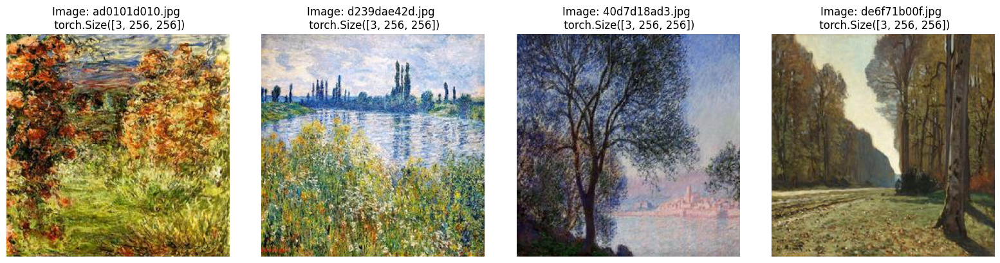

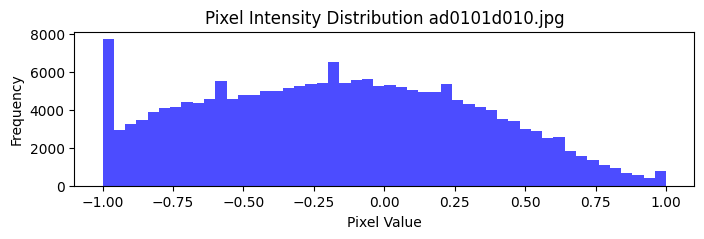

In [5]:
print_images((real_monet1,real_monet_idx1), images_to_display=4, show_pixel_distribution=True)

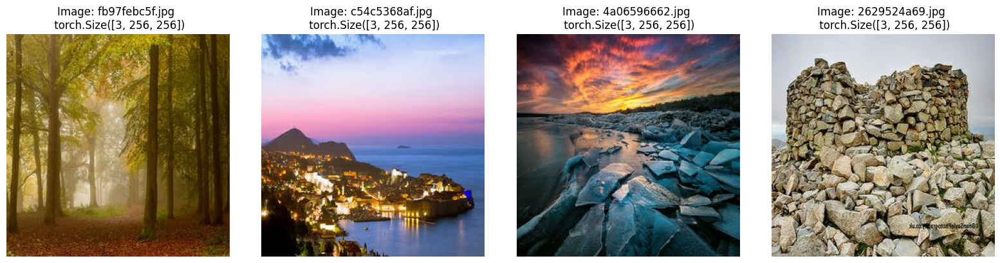

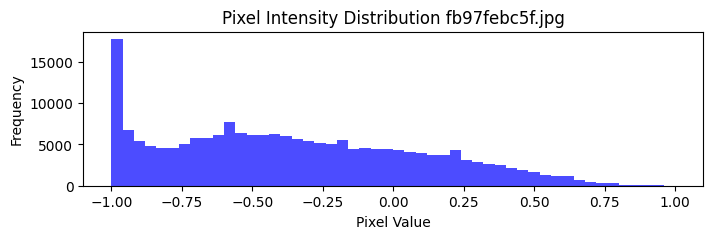

In [6]:
print_images((real_photo1,real_photo_idx1), images_to_display=4, show_pixel_distribution=True)

## Model Definition


### CycleGAN PyTorch Implementation

#### Generator (ResNet-based):

- The generator uses an encoder-decoder structure with residual blocks in the middle.
    - Encoder: Initial convolution layers (with reflection padding) downsample the input.
    - Transformer: Multiple residual blocks (each adds its input to its output) help preserve image content while enabling style transformation.
    - Decoder: Upsampling layers (transposed convolutions) restore the image to its original size.
- Normalization: Instance normalization is used throughout for stable training.
- Activation: ReLU for most layers, Tanh for the output to produce values in [-1, 1].

#### Discriminator (PatchGAN):

- The discriminator is a convolutional network that classifies each patch of the image as real or fake, rather than the whole image.
- This helps focus on high-frequency details and textures.

#### Training Details:

- Two generators (photo→Monet, Monet→photo) and two discriminators (for each domain).

- Losses:
    - Adversarial loss: Makes generated images indistinguishable from real ones.
    - Cycle consistency loss: Ensures translating to the other domain and back reconstructs the original image.
    - Identity loss: Encourages generators to preserve color/content when fed images from the target domain.
- Optimizers: Adam with learning rate scheduling.
- Mixed precision: Used for efficient training.

#### Training Loop:

- For each batch:
    - Generate fake Monet and fake photo images.
    - Compute generator losses (adversarial, cycle, identity), backpropagate, and update generators.
    - Compute discriminator losses for real and fake images, backpropagate, and update discriminators.
    - Adjust learning rates with schedulers.

In [7]:
# Basic Residual Block for Generator
class ResidualBlock(nn.Module):
    def __init__(self, channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, 3, 1, 0),
            nn.InstanceNorm2d(channels),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(channels, channels, 3, 1, 0),
            nn.InstanceNorm2d(channels)
        )
    def forward(self, x):
        return x + self.block(x)

# ResNet Generator
class ResnetGenerator(nn.Module):
    def __init__(self, in_channels=3, out_channels=3, n_features=64, n_blocks=6):
        super().__init__()
        # Initial convolution block
        layers = [
            nn.ReflectionPad2d(3),
            nn.Conv2d(in_channels, n_features, 7),
            nn.InstanceNorm2d(n_features),
            nn.ReLU(inplace=True)
        ]
        # Downsampling
        curr_features = n_features
        for _ in range(2):
            layers += [
                nn.Conv2d(curr_features, curr_features*2, 3, stride=2, padding=1),
                nn.InstanceNorm2d(curr_features*2),
                nn.ReLU(inplace=True)
            ]
            curr_features *= 2
        # Residual blocks
        for _ in range(n_blocks):
            layers.append(ResidualBlock(curr_features))
        # Upsampling
        for _ in range(2):
            layers += [
                nn.ConvTranspose2d(curr_features, curr_features//2, 3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(curr_features//2),
                nn.ReLU(inplace=True)
            ]
            curr_features //= 2
        # Output layer
        layers += [
            nn.ReflectionPad2d(3),
            nn.Conv2d(curr_features, out_channels, 7),
            nn.Tanh()
        ]
        self.model = nn.Sequential(*layers)
    def forward(self, x):
        return self.model(x)

# PatchGAN Discriminator
class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels=3, n_features=64):
        super().__init__()
        layers = [
            nn.Conv2d(in_channels, n_features, 4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True)
        ]
        curr_features = n_features
        for n in [n_features*2, n_features*4, n_features*8]:
            stride = 1 if n == n_features*8 else 2
            layers += [
                nn.Conv2d(curr_features, n, 4, stride=stride, padding=1),
                nn.InstanceNorm2d(n),
                nn.LeakyReLU(0.2, inplace=True)
            ]
            curr_features = n
        layers += [nn.Conv2d(curr_features, 1, 4, stride=1, padding=1)]
        self.model = nn.Sequential(*layers)
    def forward(self, x):
        return self.model(x)


## Model training

In [8]:
# Instantiate models
G_PM = ResnetGenerator(in_channels=IN_CHANNELS, out_channels=OUT_CHANNELS, n_features=N_FEATURES, n_blocks=N_BLOCKS).to(device)
D_M = PatchDiscriminator(in_channels=IN_CHANNELS, n_features=N_FEATURES).to(device)

F_MP = ResnetGenerator(in_channels=IN_CHANNELS, out_channels=OUT_CHANNELS, n_features=N_FEATURES, n_blocks=N_BLOCKS).to(device)
D_P = PatchDiscriminator(in_channels=IN_CHANNELS, n_features=N_FEATURES).to(device)

# Losses and optimizers
criterion_GAN = nn.MSELoss().to(device)
criterion_cycle = nn.L1Loss().to(device)
criterion_identity = nn.L1Loss().to(device)

optimizer_G = torch.optim.Adam(list(G_PM.parameters()) + list(F_MP.parameters()), lr=0.0002, betas=(0.5, 0.999))
optimizer_D_M = torch.optim.Adam(D_M.parameters(), lr=LR, betas=BETAS)
optimizer_D_P = torch.optim.Adam(D_P.parameters(), lr=LR, betas=BETAS)


In [9]:
# Learning rate schedulers
def lambda_rule(epoch):
    lr_l = 1.0 - max(0, epoch - N_EPOCHS//2) / float(N_EPOCHS//2 + 1)
    return max(lr_l, 0.0)  # Prevent negative LR

scheduler_G = torch.optim.lr_scheduler.LambdaLR(optimizer_G, lr_lambda=lambda_rule)
scheduler_D_M = torch.optim.lr_scheduler.LambdaLR(optimizer_D_M, lr_lambda=lambda_rule)
scheduler_D_P = torch.optim.lr_scheduler.LambdaLR(optimizer_D_P, lr_lambda=lambda_rule)


In [10]:
summary(G_PM, (3,256,256))
summary(F_MP, (3,256,256))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 3, 262, 262]               0
            Conv2d-2         [-1, 64, 256, 256]           9,472
    InstanceNorm2d-3         [-1, 64, 256, 256]               0
              ReLU-4         [-1, 64, 256, 256]               0
            Conv2d-5        [-1, 128, 128, 128]          73,856
    InstanceNorm2d-6        [-1, 128, 128, 128]               0
              ReLU-7        [-1, 128, 128, 128]               0
            Conv2d-8          [-1, 256, 64, 64]         295,168
    InstanceNorm2d-9          [-1, 256, 64, 64]               0
             ReLU-10          [-1, 256, 64, 64]               0
  ReflectionPad2d-11          [-1, 256, 66, 66]               0
           Conv2d-12          [-1, 256, 64, 64]         590,080
   InstanceNorm2d-13          [-1, 256, 64, 64]               0
             ReLU-14          [-1, 256,

In [11]:
def sample_images(real_A, real_B, figside=1.5):
    #assert real_A.size() == real_B.size(), 'The image size for two domains must be the same'
    
    G_PM.eval()
    F_MP.eval()
    
    real_A = real_A.to(device)
    fake_B = G_PM(real_A).detach()
    real_B = real_B.to(device)
    fake_A = F_MP(real_B).detach()
    
    nrows = real_A.size(0)
    real_A = make_grid(real_A, nrow=nrows, normalize=True)
    fake_B = make_grid(fake_B, nrow=nrows, normalize=True)
    real_B = make_grid(real_B, nrow=nrows, normalize=True)
    fake_A = make_grid(fake_A, nrow=nrows, normalize=True)
    
    image_grid = torch.cat((real_A, fake_B, real_B, fake_A), 1).cpu().permute(1, 2, 0)
    
    plt.figure(figsize=(figside*nrows, figside*4))
    plt.imshow(image_grid)
    plt.axis('off')
    plt.show()

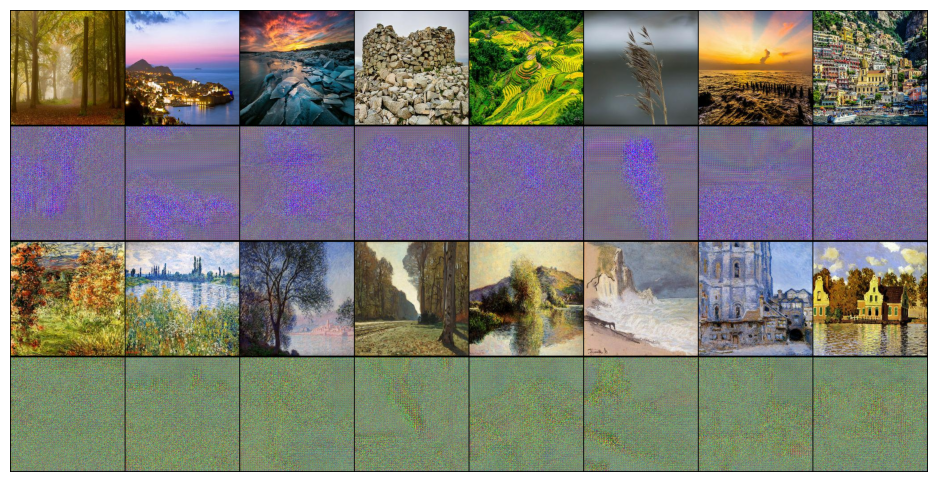

In [12]:
sample_images(real_photo1, real_monet1)

/tmp/ipykernel_19/3816028147.py:2: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_19/3816028147.py:28: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_19/3816028147.py:55: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/tmp/ipykernel_19/3816028147.py:64: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:227: UserWarning: Detected call of `lr_scheduler.step()` before `optimizer.step()`. In PyTorch 1.1.0 and later, you should call them in the opposite ord

[Epoch 1/100][Batch 1/10] G Loss: 13.3620 D_M Loss: 0.5989 D_P Loss: 0.7123 LR: 0.000200


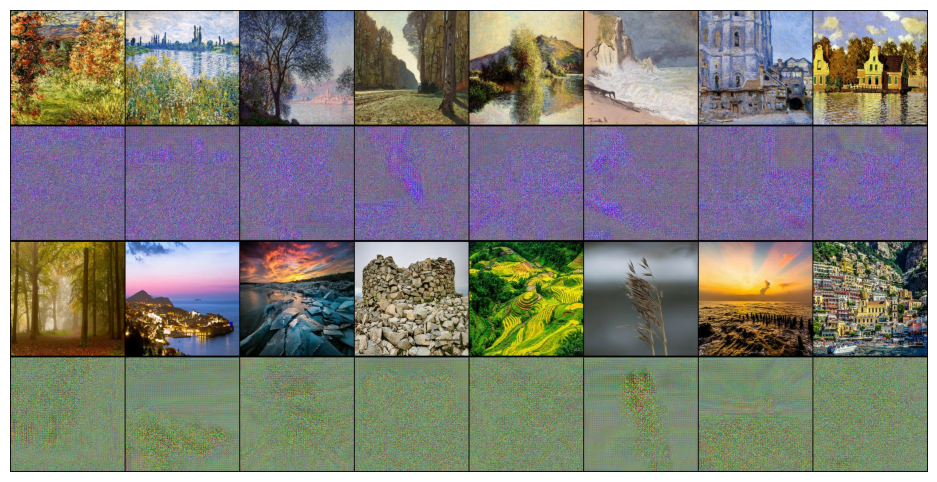

[Epoch 21/100][Batch 1/10] G Loss: 5.1589 D_M Loss: 0.2385 D_P Loss: 0.2441 LR: 0.000000


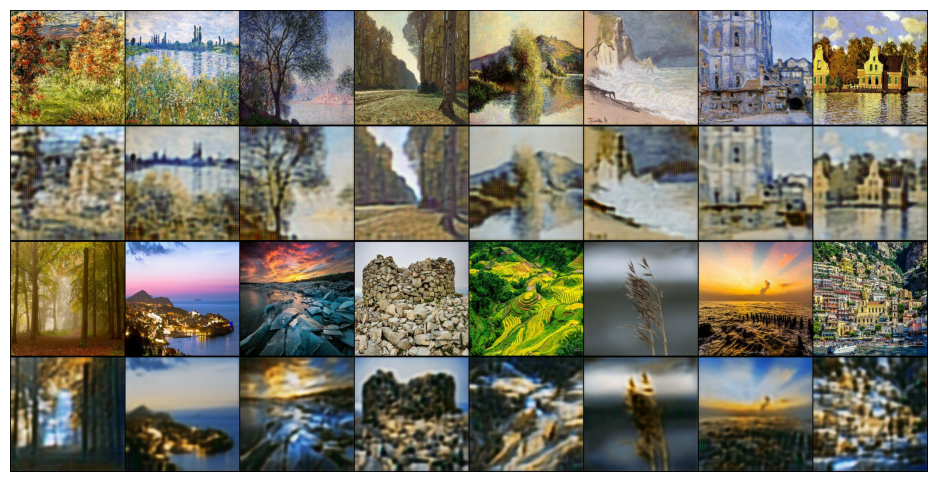

[Epoch 41/100][Batch 1/10] G Loss: 5.9429 D_M Loss: 0.2243 D_P Loss: 0.2172 LR: 0.000000


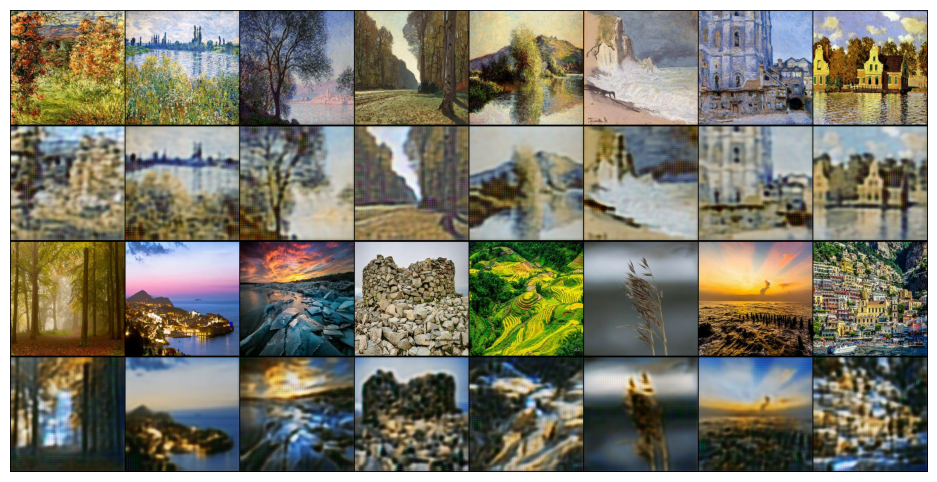

[Epoch 61/100][Batch 1/10] G Loss: 5.9279 D_M Loss: 0.2148 D_P Loss: 0.2239 LR: 0.000000


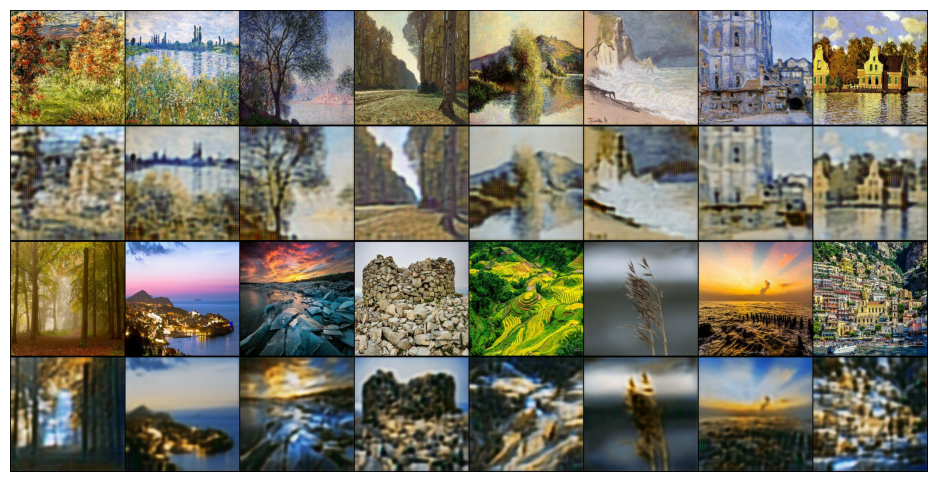

[Epoch 81/100][Batch 1/10] G Loss: 5.6572 D_M Loss: 0.2306 D_P Loss: 0.2323 LR: 0.000000


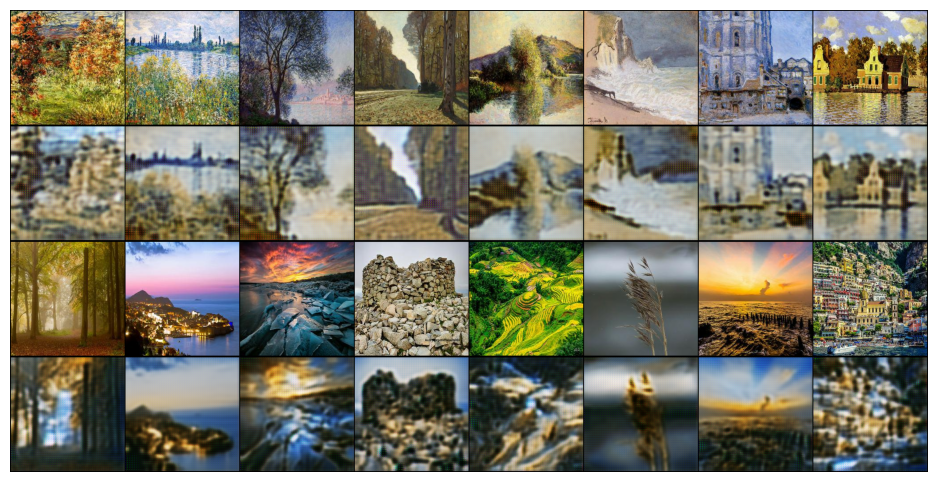

In [13]:

# Mixed precision scaler
scaler = torch.cuda.amp.GradScaler()

for epoch in range(N_EPOCHS):
    monet_iter = iter(dataloader_monet)
    photo_iter = iter(dataloader_photo_train)
    num_batches = min(len(dataloader_monet), len(dataloader_photo_train))
    
    for i in range(num_batches):
        real_photo = next(photo_iter)[0].to(device)
        real_monet = next(monet_iter)[0].to(device)

        G_PM.train()
        F_MP.train()
        
        # Dynamically get PatchGAN output shape
        with torch.no_grad():
            patch_shape = D_M(real_monet[:1]).shape[1:]

        valid = torch.ones((real_photo.size(0), *patch_shape), device=device)
        fake = torch.zeros((real_photo.size(0), *patch_shape), device=device)

        # ----------------------
        #  Train Generators (with mixed precision)
        # ----------------------
        optimizer_G.zero_grad()
        
        with torch.cuda.amp.autocast():
            # Forward pass
            fake_monet = G_PM(real_photo)
            fake_photo = F_MP(real_monet)
            recov_photo = F_MP(fake_monet)
            recov_monet = G_PM(fake_photo)
            
            # Calculate losses
            loss_GAN_PM = criterion_GAN(D_M(fake_monet), valid)
            loss_GAN_MP = criterion_GAN(D_P(fake_photo), valid)
            loss_cycle = criterion_cycle(recov_photo, real_photo) + criterion_cycle(recov_monet, real_monet)
            loss_id_photo = criterion_identity(F_MP(real_photo), real_photo)
            loss_id_monet = criterion_identity(G_PM(real_monet), real_monet)
            loss_identity = loss_id_photo + loss_id_monet
            
            # Total generator loss
            loss_G = loss_GAN_PM + loss_GAN_MP + 10.0 * loss_cycle + 0.5 * loss_identity
        
        # Scaled backward pass
        scaler.scale(loss_G).backward()
        scaler.step(optimizer_G)
        
        # ----------------------
        #  Train Discriminators (with mixed precision)
        # ----------------------
        # Monet discriminator
        optimizer_D_M.zero_grad()
        with torch.cuda.amp.autocast():
            loss_D_M_real = criterion_GAN(D_M(real_monet), valid)
            loss_D_M_fake = criterion_GAN(D_M(fake_monet.detach()), fake)
            loss_D_M = (loss_D_M_real + loss_D_M_fake) * 0.5
        scaler.scale(loss_D_M).backward()
        scaler.step(optimizer_D_M)
        
        # Photo discriminator
        optimizer_D_P.zero_grad()
        with torch.cuda.amp.autocast():
            loss_D_P_real = criterion_GAN(D_P(real_photo), valid)
            loss_D_P_fake = criterion_GAN(D_P(fake_photo.detach()), fake)
            loss_D_P = (loss_D_P_real + loss_D_P_fake) * 0.5
        scaler.scale(loss_D_P).backward()
        scaler.step(optimizer_D_P)
        
        # Update scaler
        scaler.update()
        
        # Update schedulers
        scheduler_G.step()
        scheduler_D_M.step()
        scheduler_D_P.step()

        # Logging and visualization
        if i % 50 == 0 and epoch % PRINT_EPOCH == 0:
            print(f"[Epoch {epoch+1}/{N_EPOCHS}][Batch {i+1}/{num_batches}] "
                  f"G Loss: {loss_G.item():.4f} "
                  f"D_M Loss: {loss_D_M.item():.4f} "
                  f"D_P Loss: {loss_D_P.item():.4f} "
                  f"LR: {scheduler_G.get_last_lr()[0]:.6f}")
            
            # Generate visuals
            sample_images(real_monet1, real_photo1)
                
                

## Submit Images

In [14]:

G_PM.eval()
image_filenames = []
for i, (img_batch, _) in enumerate(dataloader_photo_test):
    img_batch = img_batch.to(device)
    with torch.no_grad():
        monet_imgs = G_PM(img_batch)
        monet_imgs = (monet_imgs * 0.5) + 0.5  # Denormalize

    # Process each image in the current batch
    for j in range(monet_imgs.size(0)):
        single_img = monet_imgs[j]  # shape: [C, H, W]
        file_name = f'monet_{i}_{j}.png'
        save_image(single_img, file_name)
        image_filenames.append(file_name)

In [15]:
import zipfile
import os

# Create a ZIP file and add each image
with zipfile.ZipFile('images.zip', 'w') as zipf:
    for filename in image_filenames:
        zipf.write(filename)
        os.remove(filename)  # Remove the file after adding it to the zip

### Discussion
The observed decrease in generator and discriminator losses throught all epochs suggests that the CycleGAN model continued to improve its ability to translate images between the photo and Monet domains. Lower discriminator losses indicate that the discriminators are effectively distinguishing real from generated images, but not overpowering the generators, which is crucial for stable GAN training.

The generator loss, which combines adversarial, cycle-consistency, and identity losses, dropped from 7.45 to 6.59, reflecting better translation quality and improved cycle consistency. The discriminator losses (both D_M and D_P) fell to below 0.3, which is typical as the discriminators become more confident in their classifications, but not so low as to indicate overfitting or mode collapse.

The learning rate decay aligns with standard GAN training practices, helping to stabilize training and fine-tune the generators in later epochs.

### Conclusion
The CycleGAN model shows steady improvement in both generator and discriminator performance as training advances, evidenced by decreasing loss values. The generator is learning to produce more convincing Monet-style images from photos, while the discriminators maintain their ability to evaluate authenticity. The gradual reduction in learning rate supports this refinement process. For further improvement or to determine the optimal stopping point, visual inspection of generated images and/or quantitative metrics like FID or Inception Score are recommended, as loss values alone may not fully capture perceptual quality